# Train Wheatlo's Detector - 2nd Stage

In [1]:
import pandas as pd

import json
import os

import matplotlib.pyplot as plt

import cv2

from albumentations import Compose,HueSaturationValue, ShiftScaleRotate, Resize, CenterCrop, HorizontalFlip, RandomBrightnessContrast, PadIfNeeded, LongestMaxSize, BboxParams

import darknet as dn
import util as util
import util2 as util2

from torch.utils.data import Dataset, DataLoader
import torch

from torch.optim import lr_scheduler

import torch.optim as optim

import numpy as np

import time

In [2]:
np.set_printoptions(precision=4, suppress = True, edgeitems = 8)

In [3]:
inp_dim = 416
stride = 32
num_anchors = 5

confidence = 0.5
nms_thesh = 0.4

batch_size = 16
width = 1024
height = 1024

## 1. Create training dataset

In [4]:
img_dir = "../wheat/train/"

### Create a data table

In [5]:
data = pd.read_csv("../wheat/train.csv")

In [6]:
data.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [7]:
data["width"].unique()

array([1024])

In [8]:
data["height"].unique()

array([1024])

In [9]:
data.drop(columns = ['width', 'height', 'source'], inplace = True)

In [10]:
def listStr2Float(x):
    
    x = x[1:-1]
    x = x.split(",")
    y = list()
    for i in x:
        a = float(i)
        y.append(a)
    return y    

In [11]:
data['bbox'] = data['bbox'].apply(listStr2Float)

In [12]:
data = data.groupby('image_id').aggregate({'bbox':lambda x: x.to_list()})

In [13]:
data.reset_index(inplace = True)
data.head()

,image_id,bbox
0,00333207f,"[[0.0, 654.0, 37.0, 111.0], [0.0, 817.0, 135.0..."
1,005b0d8bb,"[[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15..."
2,006a994f7,"[[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11..."
3,00764ad5d,"[[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1..."
4,00b5fefed,"[[709.0, 97.0, 204.0, 105.0], [775.0, 250.0, 1..."


In [14]:
data['image_id'] = data['image_id'].apply(lambda x:x+'.jpg')

#### *Note that the bounding boxes are in the format of [xmin, ymin, w, h]

In [15]:
data.head()

,image_id,bbox
0,00333207f.jpg,"[[0.0, 654.0, 37.0, 111.0], [0.0, 817.0, 135.0..."
1,005b0d8bb.jpg,"[[765.0, 879.0, 116.0, 79.0], [84.0, 539.0, 15..."
2,006a994f7.jpg,"[[437.0, 988.0, 98.0, 36.0], [309.0, 527.0, 11..."
3,00764ad5d.jpg,"[[89.0, 256.0, 113.0, 107.0], [216.0, 282.0, 1..."
4,00b5fefed.jpg,"[[709.0, 97.0, 204.0, 105.0], [775.0, 250.0, 1..."


### Create image transforms

#### *label_fields is a required argument for BboxParams and 'class_labels' is supposed to be a vector of labels corresponds to the vector of bounding boxes. Since we only have one class, we will just give it a vector of zeros when we construct the transform later on.

In [16]:
img_transform = Compose([LongestMaxSize(inp_dim), PadIfNeeded(inp_dim, inp_dim, cv2.BORDER_CONSTANT), ShiftScaleRotate(rotate_limit = 0, p=0.75), RandomBrightnessContrast(p=0.75), HueSaturationValue(p=0.75)],
                       bbox_params=BboxParams(format='coco', label_fields=['class_labels']))

img_transform_val = Compose([LongestMaxSize(inp_dim), PadIfNeeded(inp_dim, inp_dim, cv2.BORDER_CONSTANT)],
                       bbox_params=BboxParams(format='coco', label_fields=['class_labels']))

img_only_transform = Compose([LongestMaxSize(inp_dim), PadIfNeeded(inp_dim, inp_dim, cv2.BORDER_CONSTANT)])

### Create PyTorch datasets

In [17]:
def collate_fn(dataset):
    '''
    input dataset is a list, 
    length of list = batch size
    '''
    
    idx = [dataset[0][0]]
    img = dataset[0][1].unsqueeze(0)
    bboxes = {0: dataset[0][2]}
    
    for i in range(1, len(dataset)):
        
        new_img = dataset[i][1].unsqueeze(0)
        img = torch.cat((img, new_img), 0)
        
        idx.append(dataset[i][0])
               
        bboxes[i] = dataset[i][2]
   
    return (idx, img, bboxes)

In [18]:
class ImgDataset(Dataset):
    
    def __init__(self, img_dir, data_table, img_transform):
        
        self.imgdir = img_dir
        self.table = data_table
      
        self.imgtransform = img_transform

    def __len__(self):
        return len(self.table)

    def __getitem__(self, idx):
                
        mat = cv2.imread(self.imgdir+self.table.iloc[idx]['image_id'])    
        
        augmented = self.imgtransform(image = mat, bboxes = self.table.iloc[idx]['bbox'], class_labels = torch.zeros(len(self.table.iloc[idx]['bbox'])))
        mat = augmented['image']  
        
        mat = mat[:,:,::-1].transpose((2,0,1)).copy()
        img = torch.from_numpy(mat).div(255.0)
       
        return (idx, img, augmented['bboxes'])

In [19]:
val_data = data.iloc[0:20]
data = data.iloc[20:]

In [20]:
len(data)

3353

In [21]:
imgds = ImgDataset(img_dir, data, img_transform)
imgds_val = ImgDataset(img_dir, val_data, img_transform_val)

In [22]:
imgloader = DataLoader(imgds, batch_size= batch_size, shuffle=False, collate_fn = collate_fn)

imgloader_val = DataLoader(imgds_val, batch_size=2, shuffle=False, collate_fn = collate_fn)

In [23]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

### Take a look at the ground truth

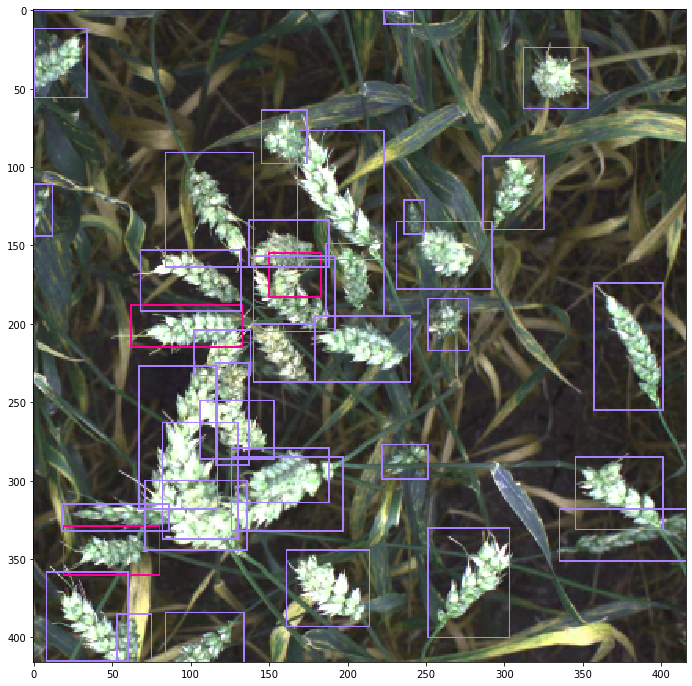

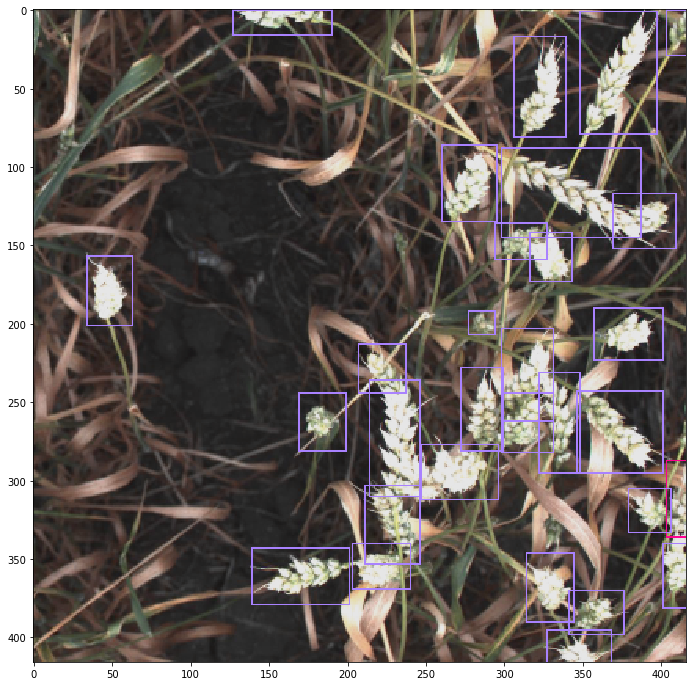

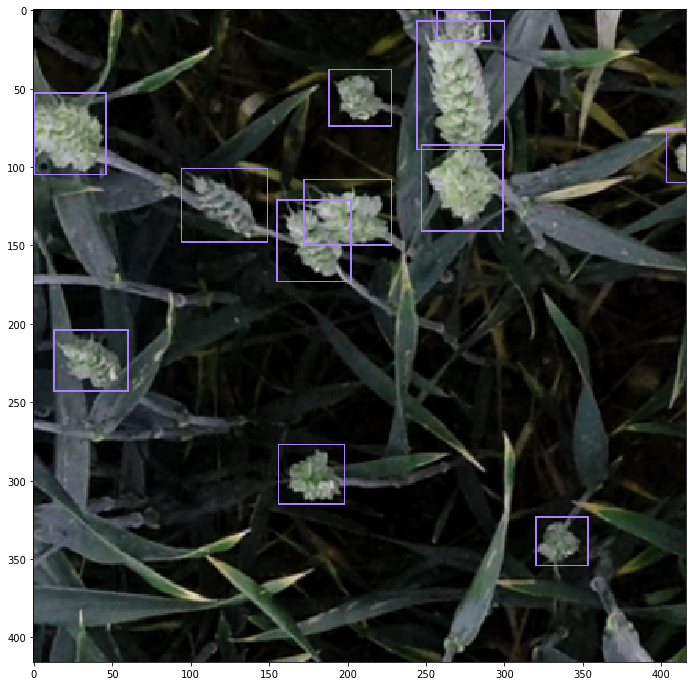

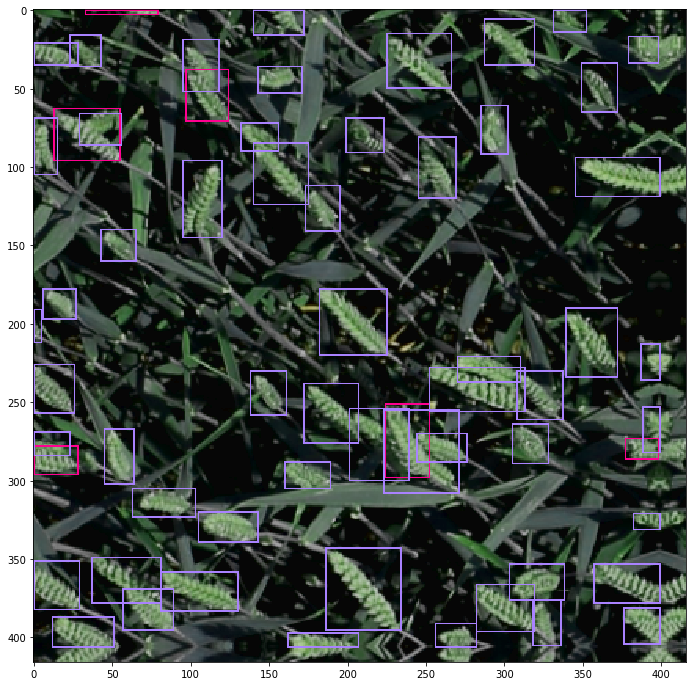

In [24]:
batched_idx, batched_img, batched_bboxes= next(iter(imgloader))
ground_truth = util2.ground_truth_transform(batched_bboxes,inp_dim, stride)

#debug - check if ground truth bounding box is assigned to correct grid
# 
# a = util.check_ground_truth_grid(ground_truth)  
# np.set_printoptions(threshold=10_000)
# print(a.numpy())
    
for i in range(len(batched_img)):
    
    ind = batched_idx[i]
    bboxes = batched_bboxes[i]
    img = batched_img[i,:,:,:].squeeze(0).numpy().transpose((1,2,0))
        
    util2.visualize_transformed_ground_truth(img, bboxes, ground_truth[i,:,:4])
    
    if i > 2:
        break


## 2. Create detector model

In [25]:
cfgfile = "../cfg/darknet_feature_extractor.cfg"

model = dn.Darknet(cfgfile, inp_dim)
#model.add_extractor_layers()
#model.load_state_dict(torch.load("wheatlo_extractor.pth"))

Total number of lines in file: 555


In [26]:
#model.remove_extractor_layers()

In [27]:
cfgfile = "../cfg/yolov3_detector.cfg"
model.add_detector_layers(cfgfile)
#model = util2.init_detector_weights(model)

model.load_state_dict(torch.load("wheatlo_detector_5anchors_stage1.pth"))
model = util2.set_DT_requires_grad_only(model)

Total number of lines in file: 70


### Let's look at the detector's output before we train it

In [28]:
m=model.eval()
m=model.to(device)

/pytorch/torch/csrc/utils/python_arg_parser.cpp:756: UserWarning: This overload of nonzero is deprecated:
	nonzero(Tensor input, *, Tensor out)
Consider using one of the following signatures instead:
	nonzero(Tensor input, *, bool as_tuple)


Total number of bounding box found: 43


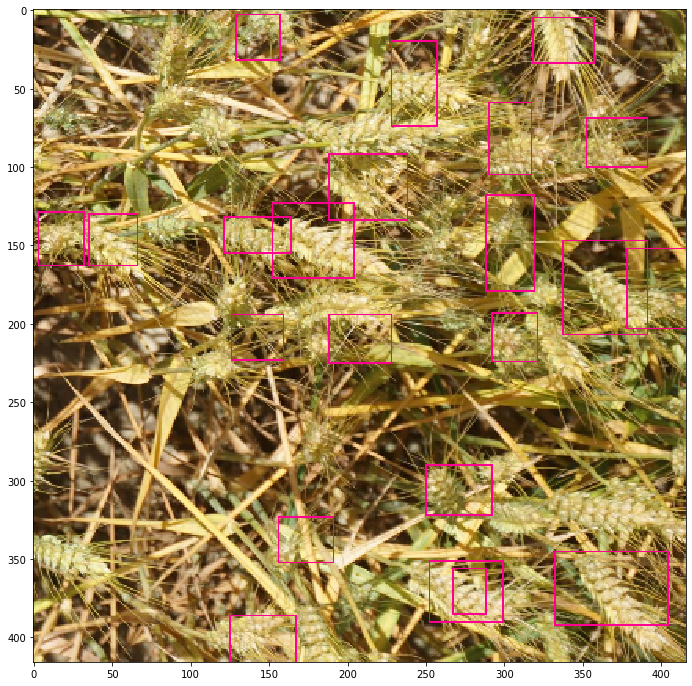

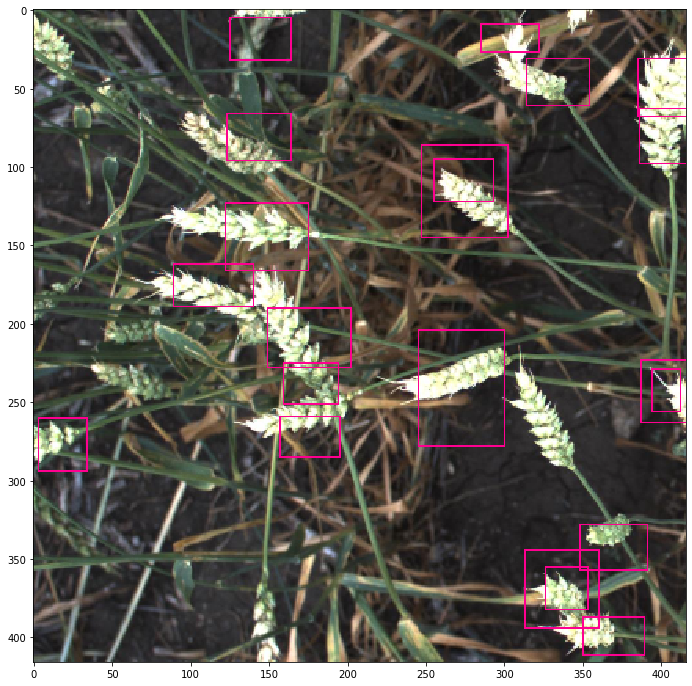

In [29]:
output = {}

idx, img, bboxes = next(iter(imgloader_val))
      
img = img.to(device)

with torch.set_grad_enabled(False):
    prediction = model(img)

    prediction = util.write_results(prediction, confidence, nms_conf = nms_thesh)

if type(prediction) == int:
    print("No prediction found")
    
else:
    print(f"Total number of bounding box found: {prediction.shape[0]}")    
    for j in range(prediction.shape[0]):

        batch_id = int(prediction[j,0])

        #create a dictionary, the key is the row index in the data table (each row is one image), 
        #the value is rows of predctions for that image
        table_index = idx[batch_id]

        if (table_index in output):
            output[table_index] = torch.cat((output[table_index], prediction[j,1:].unsqueeze(0)),0)
        else:
            output[table_index] = prediction[j,1:].unsqueeze(0)
   
    util2.visualize_detector_output(output, val_data, img_dir, img_only_transform)            

## 3. Let's do some training

In [30]:
m=model.train()
m=model.to(device)

In [31]:
optimizer = optim.SGD(model.parameters(), lr=0.00001, weight_decay = 0.001, momentum=0.9)

In [32]:
num_epochs =40

since = time.time()
for epoch in range(num_epochs):  # loop over the dataset multiple times
    print(f"Epoch {epoch}/{num_epochs-1}")
    print('-' * 10)
    
    #Training
    running_loss = 0.0
    total_img = 0
    for i,(idx,img, bboxes) in enumerate(imgloader):
   
        ground_truth = util2.ground_truth_transform(bboxes, inp_dim, stride)
        img = img.to(device)
        ground_truth = ground_truth.to(device)
    
        # zero the parameter gradients
        optimizer.zero_grad()
    
        model.train()
        with torch.set_grad_enabled(True): #does not after nn.parameters
            prediction = model(img)
            loss = util2.yolo_loss(inp_dim, num_anchors, prediction, ground_truth, a1 = 1.5, b1 = 1.5, c1 = 1., d1 = .8)
            
            loss.backward()
            optimizer.step()
            
        if i%40 == 0:
            print(f"loss is {loss}")
         
        running_loss += loss.item() 
        total_img += img.size(0)
        
    #scheduler.step()   
    epoch_loss = running_loss / total_img
    print(f"epoch {epoch}: epoch loss = {epoch_loss}")   
    
    elapsed = time.time() - since
    print(f"time elapsed: {int(elapsed//60)}min {elapsed%60:1f}sec")
    
print('Finished Training')


Epoch 0/39
----------
loss is 327.80596923828125
loss is 470.935546875
loss is 447.0500793457031
loss is 428.1129455566406
loss is 420.7420349121094
loss is 460.1337585449219
epoch 0: epoch loss = 26.001828610914842
time elapsed: 3min 48.053803sec
Epoch 1/39
----------
loss is 350.5403137207031
loss is 429.251708984375
loss is 431.92803955078125
loss is 415.0953063964844
loss is 415.1719055175781
loss is 430.94110107421875
epoch 1: epoch loss = 25.409720666864327
time elapsed: 7min 28.420164sec
Epoch 2/39
----------
loss is 338.50006103515625
loss is 429.4478454589844
loss is 415.673828125
loss is 402.85601806640625
loss is 406.0712585449219
loss is 405.89874267578125
epoch 2: epoch loss = 25.0413649707206
time elapsed: 11min 11.017672sec
Epoch 3/39
----------
loss is 368.5093688964844
loss is 436.8147277832031
loss is 417.3448486328125
loss is 395.39447021484375
loss is 384.4151916503906
loss is 407.4628601074219
epoch 3: epoch loss = 24.648342998355602
time elapsed: 14min 51.660964se

Total number of bounding box found: 72
Total number of bounding box found: 60
Total number of bounding box found: 18
Total number of bounding box found: 69
Total number of bounding box found: 44
Total number of bounding box found: 78
Total number of bounding box found: 65
Total number of bounding box found: 25
Total number of bounding box found: 92
Total number of bounding box found: 72


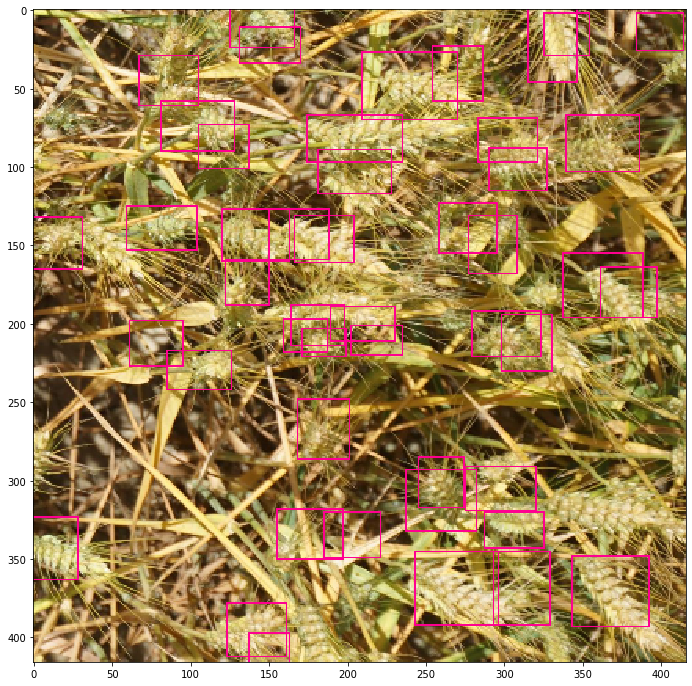

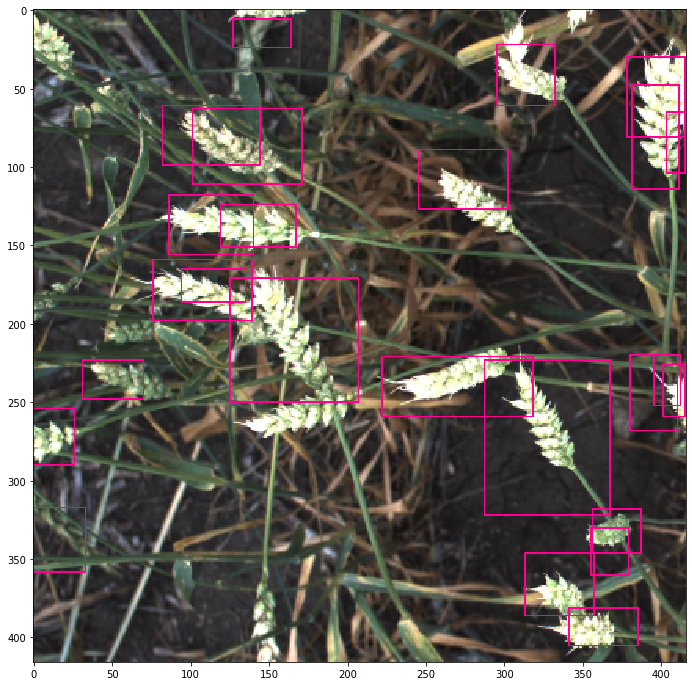

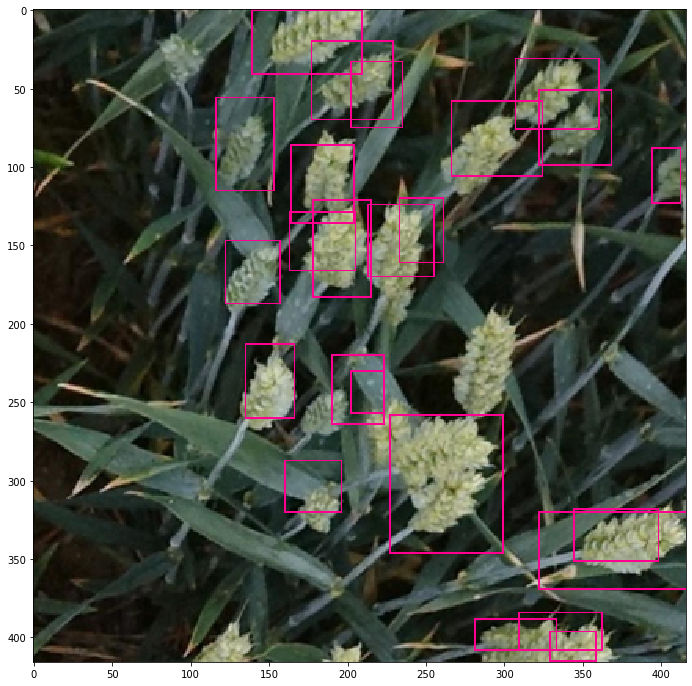

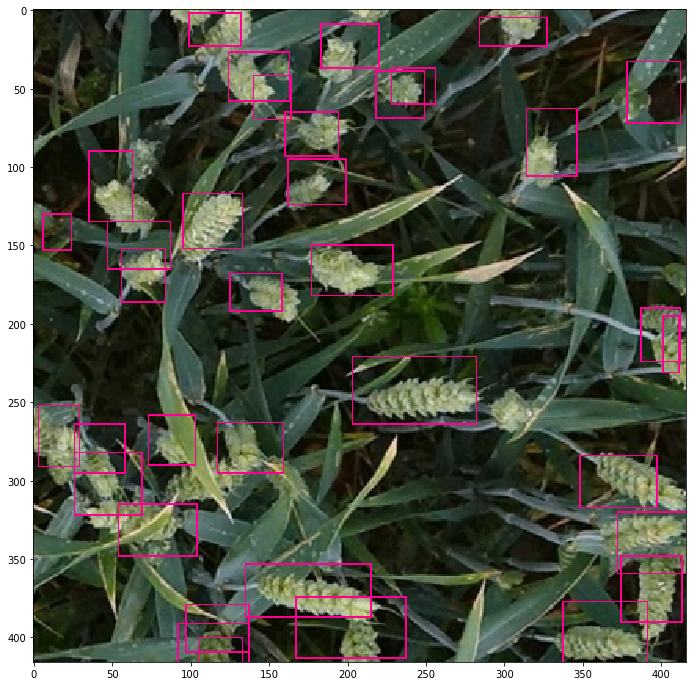

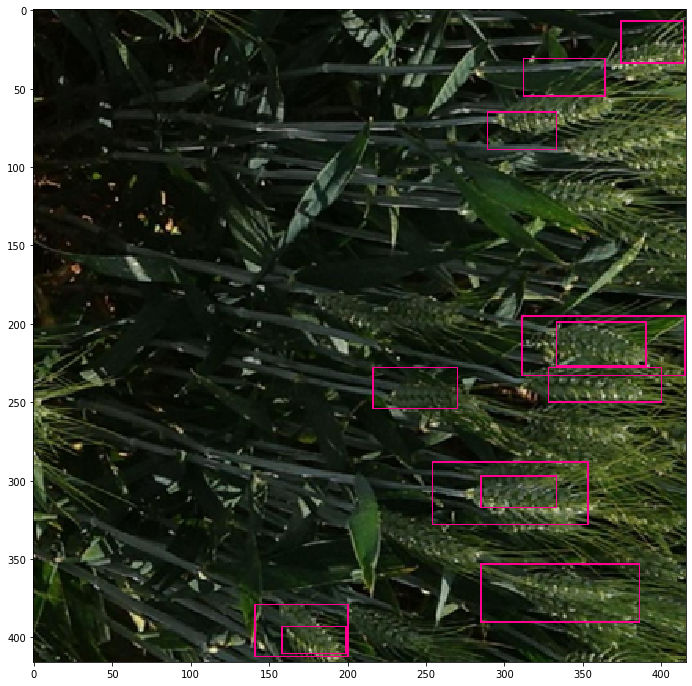

...

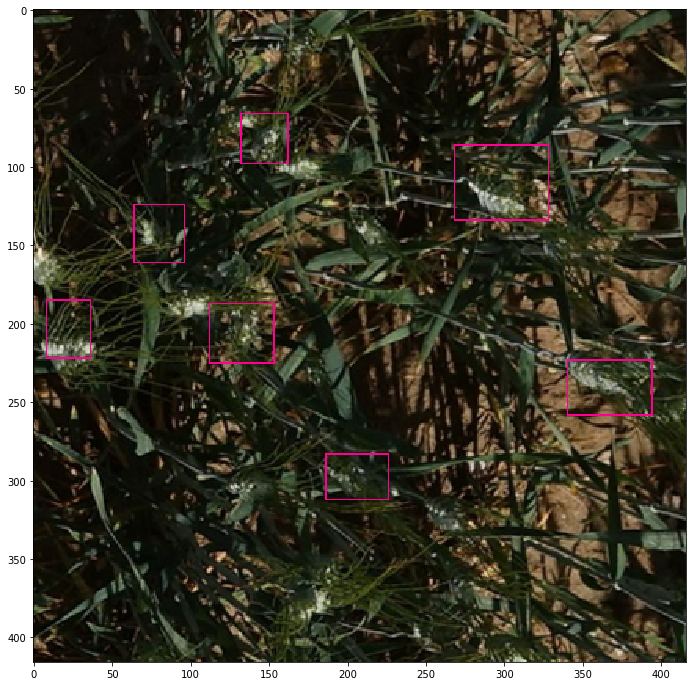

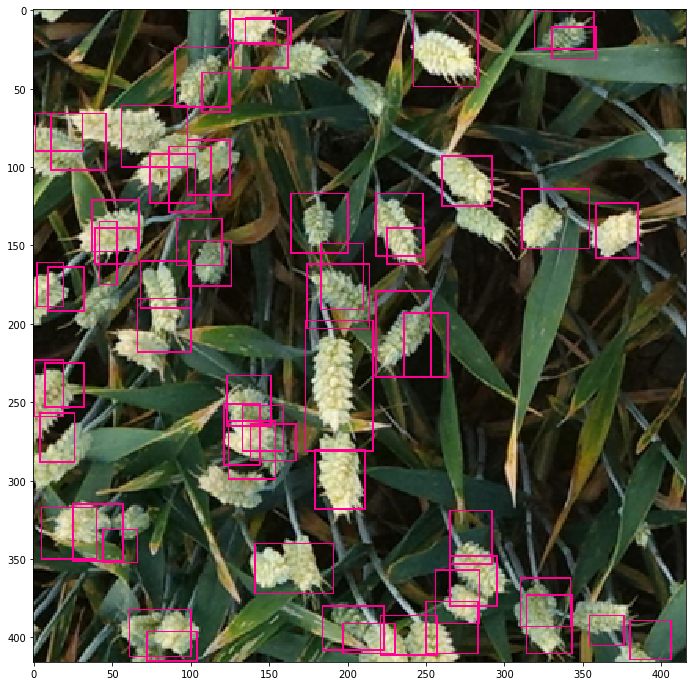

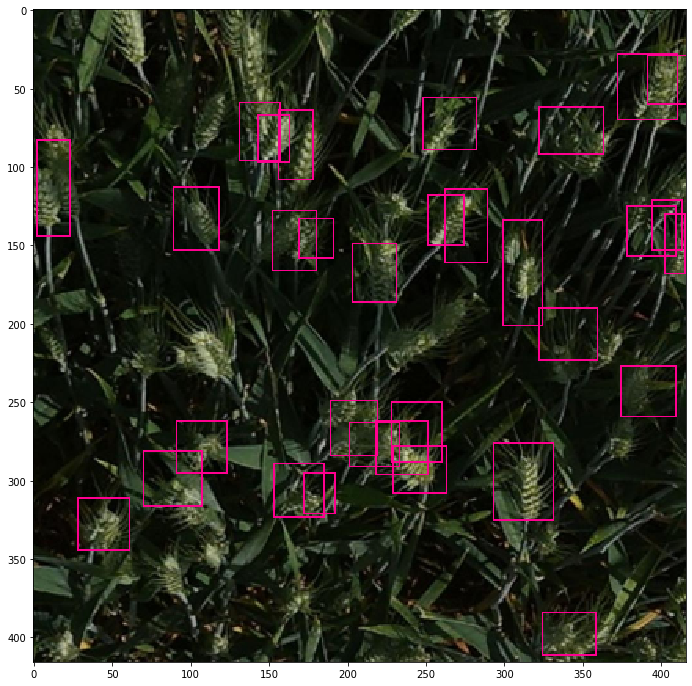

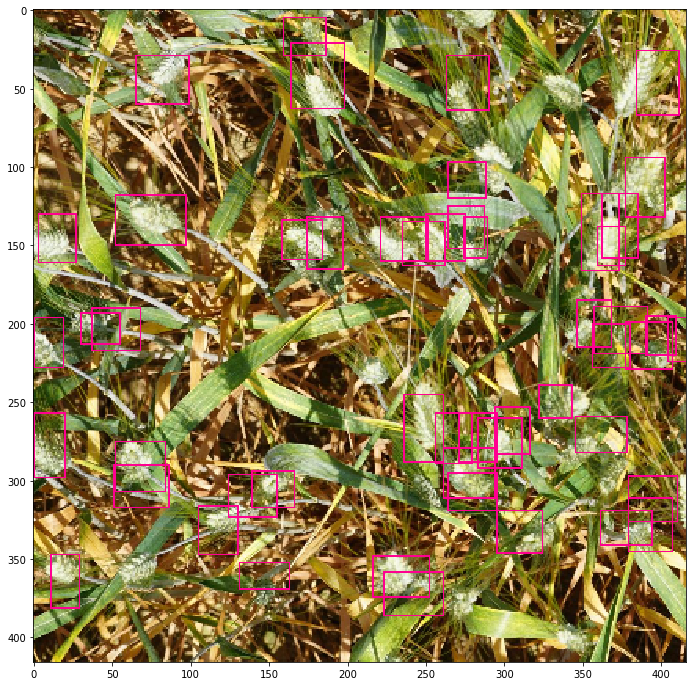

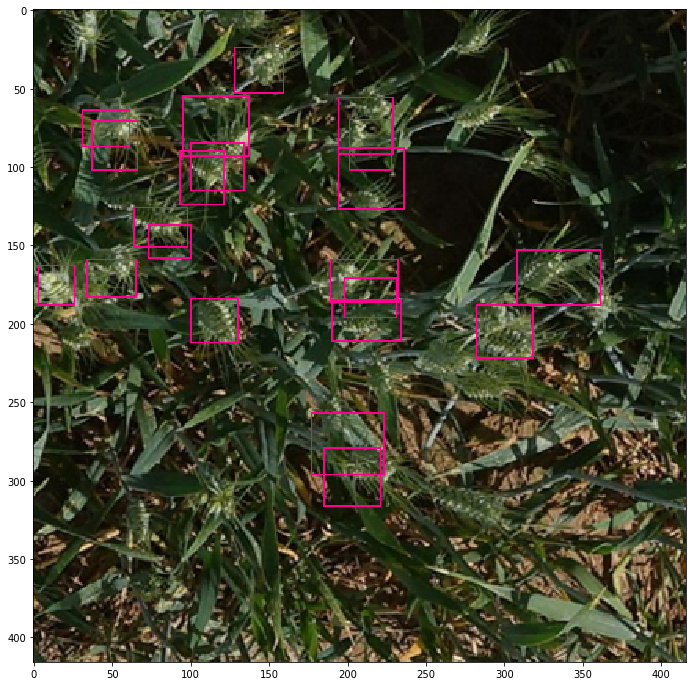

In [33]:
#Validate 
output = {}
for i, (idx,img, bboxes) in enumerate(imgloader_val):

    img = img.to(device)
    model.eval()

    with torch.set_grad_enabled(False):
        prediction = model(img)

        prediction = util.write_results(prediction, confidence, nms_conf = nms_thesh)

    if type(prediction) == int:
        print("no prediction found")
        continue 

    print(f"Total number of bounding box found: {prediction.shape[0]}")    
    for j in range(prediction.shape[0]):

        batch_id = int(prediction[j,0])

        #create a dictionary, the key is the row index in the data table (each row is one image), 
        #the value is rows of predctions for that image
        table_index = idx[batch_id]

        if (table_index in output):
            output[table_index] = torch.cat((output[table_index], prediction[j,1:].unsqueeze(0)),0)
        else:
            output[table_index] = prediction[j,1:].unsqueeze(0)
    

util2.visualize_detector_output(output, val_data, img_dir, img_only_transform) 

In [34]:
torch.save(model.state_dict(), "wheatlo_detector_5anchors_stage2.pth")